In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%config InlineBackend.figure_format = 'retina'

In [3]:
import sys
sys.path.append('../src')

In [4]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import pandas as pd
from spaceoracle.models.parallel_estimators import SpatialCellularProgramsEstimator
from spaceoracle.oracles import SpaceOracle
from spaceoracle.plotting.beta_maps import plot_spatial
from spaceoracle.tools.utils import min_max_df

In [18]:
adata_train = sc.read_h5ad('.cache/adata_train.h5ad')
adata_train

AnnData object with n_obs × n_vars = 11567 × 5013
    obs: 'cluster', 'rctd_cluster', 'rctd_celltypes'
    uns: 'log1p'
    obsm: 'X_spatial', 'rctd_results', 'spatial'
    layers: 'imputed_count', 'normalized_count', 'raw_count'

In [19]:
adata_train.obs = adata_train.obs.join(
    pd.read_csv('/Users/koush/Downloads/Il2ra_betas_clusters.csv', index_col=0).kmeans_cluster)


In [71]:
adata_train.obs.kmeans_cluster = adata_train.obs.kmeans_cluster.astype('category')

In [21]:
adata_train

AnnData object with n_obs × n_vars = 11567 × 5013
    obs: 'cluster', 'rctd_cluster', 'rctd_celltypes', 'kmeans_cluster'
    uns: 'log1p'
    obsm: 'X_spatial', 'rctd_results', 'spatial'
    layers: 'imputed_count', 'normalized_count', 'raw_count'

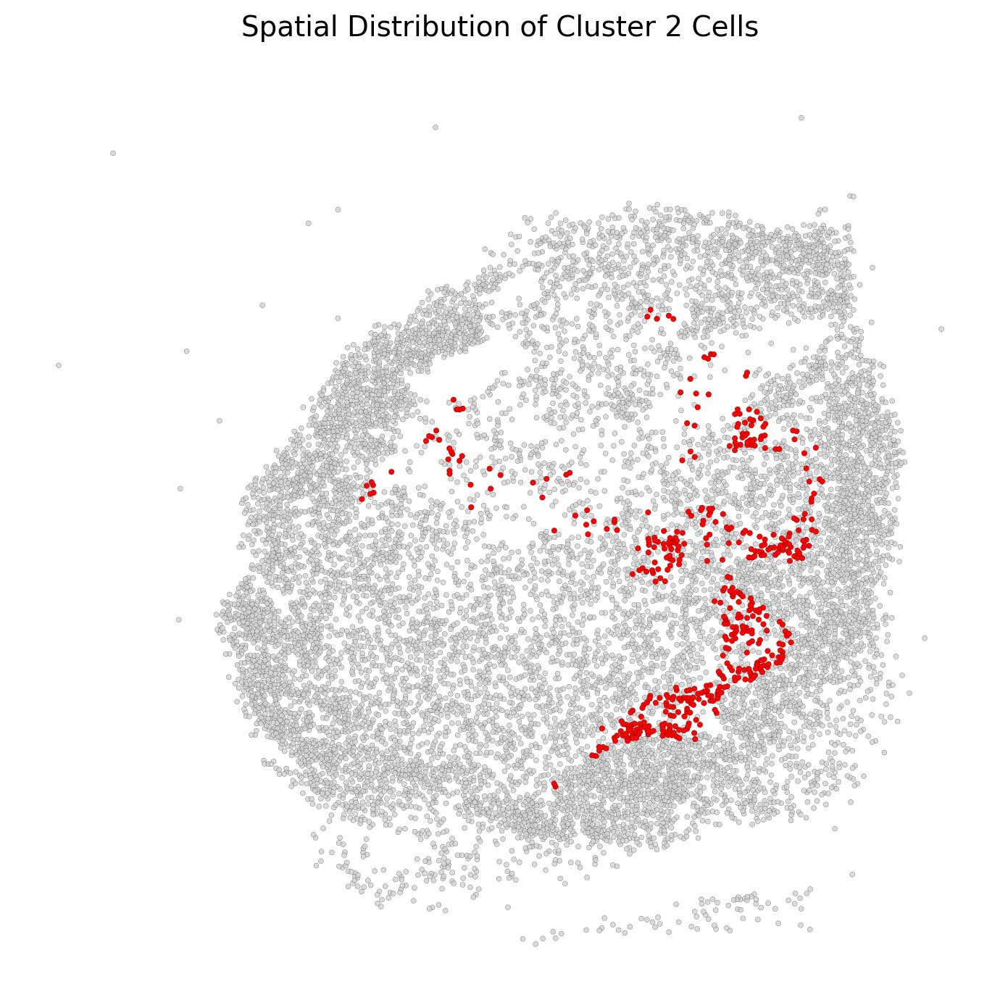

In [95]:
plt.rcParams['figure.figsize'] = (7, 7)
plt.rcParams['figure.dpi'] = 100

c = 18
# Plot all cells first with a muted color
ax = sc.pl.embedding(
    adata_train[adata_train.obs.kmeans_cluster != c], 
    basis='spatial', 
    show=False, 
    edgecolor='black',
    linewidth=0.1,
    size=25,
    alpha=0.8
)

# Overlay cluster 2 cells with a vibrant color and edge highlighting
sc.pl.embedding(
    adata_train[adata_train.obs.kmeans_cluster == c], 
    basis='spatial',
    color='kmeans_cluster',
    size=30,
    alpha=1,
    linewidth=0.1,
    ax=ax,
    edgecolor='black',
    palette=['red'], 
    show=False  # Bright red color for emphasis
)

# Customize the plot
ax.set_title('Spatial Distribution of Cluster 2 Cells', fontsize=14, pad=20)
# ax.set_xlabel('X coordinate (μm)', fontsize=12)
# ax.set_ylabel('Y coordinate (μm)', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.3)

# Remove frame/spines from the plot
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
ax.get_legend().remove()
plt.tight_layout()
plt.show()

In [26]:

# estimator_Prdm1 = SpatialCellularProgramsEstimator(
#     adata=adata_train,
#     target_gene='Prdm1',
# )

estimator_Cd74 = SpatialCellularProgramsEstimator(
    adata=adata_train,
    target_gene='Cd74',
)

# estimator_Il2 = SpatialCellularProgramsEstimator(
#     adata=adata_train,
#     target_gene='Il2',
# )

# estimator_Il2ra = SpatialCellularProgramsEstimator(
#     adata=adata_train,
#     target_gene='Il2ra',
# )

# estimator_Pax5 = SpatialCellularProgramsEstimator(
#     adata=adata_train,
#     target_gene='Pax5',
# )


estimator_Prdm1 = SpatialCellularProgramsEstimator(
    adata=adata_train,
    target_gene='Prdm1',
)

In [7]:
%%time

# estimator_Prdm1.fit(num_epochs=350, threshold_lambda=1e-4, learning_rate=5e-4)
# estimator_Cd74.fit(num_epochs=350, threshold_lambda=1e-4, learning_rate=5e-4)
# estimator_Il2.fit(num_epochs=350, threshold_lambda=1e-4, learning_rate=5e-4)
# estimator_Il2ra.fit(num_epochs=350, threshold_lambda=1e-4, learning_rate=5e-4)
# estimator_Pax5.fit(num_epochs=150, threshold_lambda=1e-4, learning_rate=5e-4)

CPU times: user 1e+03 ns, sys: 1 µs, total: 2 µs
Wall time: 2.15 µs


In [8]:
# estimator_Prdm1.betadata.to_parquet(f'./models/{estimator_Prdm1.target_gene}_betadata.parquet')
# estimator_Cd74.betadata.to_parquet(f'./models/{estimator_Cd74.target_gene}_betadata.parquet')
# estimator_Il2.betadata.to_parquet(f'./models/{estimator_Il2.target_gene}_betadata.parquet')
# estimator_Il2ra.betadata.to_parquet(f'./models/{estimator_Il2ra.target_gene}_betadata.parquet')
# estimator_Pax5.betadata.to_parquet(f'./models/{estimator_Pax5.target_gene}_betadata.parquet')

In [28]:
estimator = estimator_Prdm1

so = SpaceOracle(adata=adata_train, save_dir = './models')
beta_dict = {estimator.target_gene: so._get_betas(estimator.target_gene)}

gex_df = min_max_df(estimator.adata.to_df(layer=estimator.layer))
# gex_df = estimator.adata.to_df(layer=estimator.layer)

beta_dict = so._get_wbetas_dict(beta_dict, gex_df)
wbetas = beta_dict[estimator.target_gene].wbetas[1]
wbetas = wbetas.join(
    beta_dict[estimator.target_gene].betas[
        ['beta_'+i for i in list(estimator.lr_pairs)+list(estimator.tfl_pairs)]]
)

xy = pd.DataFrame(
    adata_train.obsm['spatial'], index=adata_train.obs.index, columns=['x', 'y'])

df = wbetas \
        .join(adata_train.obs) \
        .join(xy) \
        .join(gex_df)

Ligand interactions: 100%|██████████| 1/1 [00:00<00:00, 28.78it/s]


In [29]:
_ = estimator.init_data()

In [94]:
# estimator.lr_pairs
estimator.regulators

['Atf3',
 'Bcl11a',
 'Bclaf1',
 'Crebzf',
 'Ctcf',
 'Egr1',
 'Fos',
 'Foxp3',
 'Gata2',
 'Hdac2',
 'Hesx1',
 'Hivep1',
 'Klf13',
 'Klf4',
 'Klf7',
 'Klf9',
 'Mef2c',
 'Mybl2',
 'Nfatc4',
 'Nr2c2',
 'Nr3c1',
 'Pax5',
 'Pbx3',
 'Runx1',
 'Rxra',
 'Smad1',
 'Smad4',
 'Stat2',
 'Tal1',
 'Tbp',
 'Tcf4',
 'Tcf7l1',
 'Tcf7l2',
 'Zbtb17']

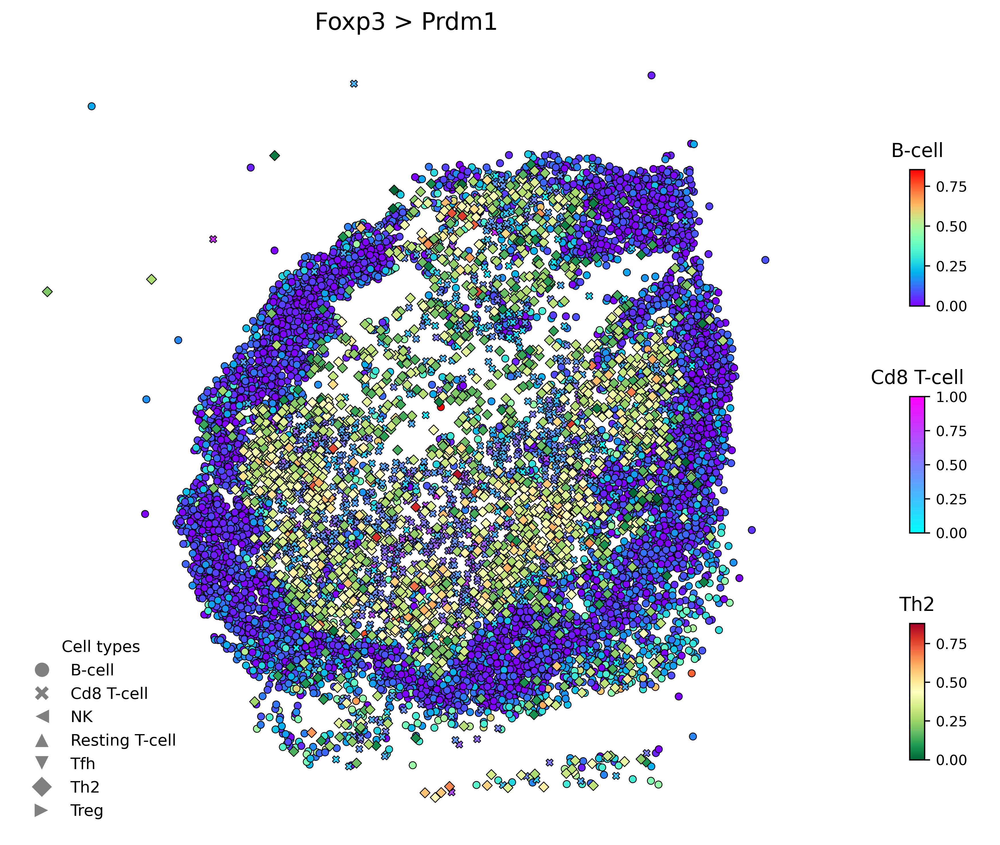

In [97]:
ax = plot_spatial(
    df=df, 
    train_df=estimator.train_df, 
    target_gene=estimator.target_gene,
    # plot_for='beta_Il4#Foxp3',
    plot_for='Foxp3',
    # plot_for='beta_Il2#Egr1',
    dpi=200, size=20)
# ax.set_title('')
plt.savefig('/tmp/img.png', dpi=200, transparent=True)
plt.show()

In [32]:
from glob import glob

In [98]:
# def load_beta(path, key='beta_Foxp3'):
#     try:
#         return pd.read_parquet(path, columns=[key])
#     except:
#         return None

# Il2_betas = pd.concat([x for x in tqdm(map(load_beta,
#     glob('/Users/koush/Downloads/models/*.parquet'))) if x is not None], axis=1)


In [53]:
from tqdm import tqdm
import anndata as ad

3125it [00:16, 194.46it/s]


In [78]:
dff = Il2_betas.mean(1).to_frame()
dff.index = adata_train.obs.index
dff = dff.join(xy).join(adata_train.obs)

In [81]:
dff

,0,x,y,cluster,rctd_cluster,rctd_celltypes
AAAAAACGGTAGAT,0.007525,-4252.0,2626.2,5,0,B-cell
AAAAAATCCGGCGA,0.017658,-2952.4,1975.3,12,4,Tfh
AAAAACCGTCAGAC,0.007031,-2480.0,1516.6,1,0,B-cell
AAAAACGCTCCGAC,0.006868,-2764.1,1255.7,1,0,B-cell
AAAAAGCACGTGTT,0.007706,-3925.9,1618.5,0,0,B-cell
...,...,...,...,...,...,...
TTTTTTCGCGGCTA,0.017447,-3754.4,1504.7,5,4,Tfh
TTTTTTGGGCTGGT,0.012801,-3547.4,2483.1,0,2,Th2
TTTTTTGTACCCAC,0.012390,-1666.5,2309.1,3,2,Th2
TTTTTTGTACGATT,0.008554,-2052.1,2937.7,1,0,B-cell


In [92]:
adata_train.layers['raw_count'].toarray().max()

5.3231463

<Axes: xlabel='x', ylabel='y'>

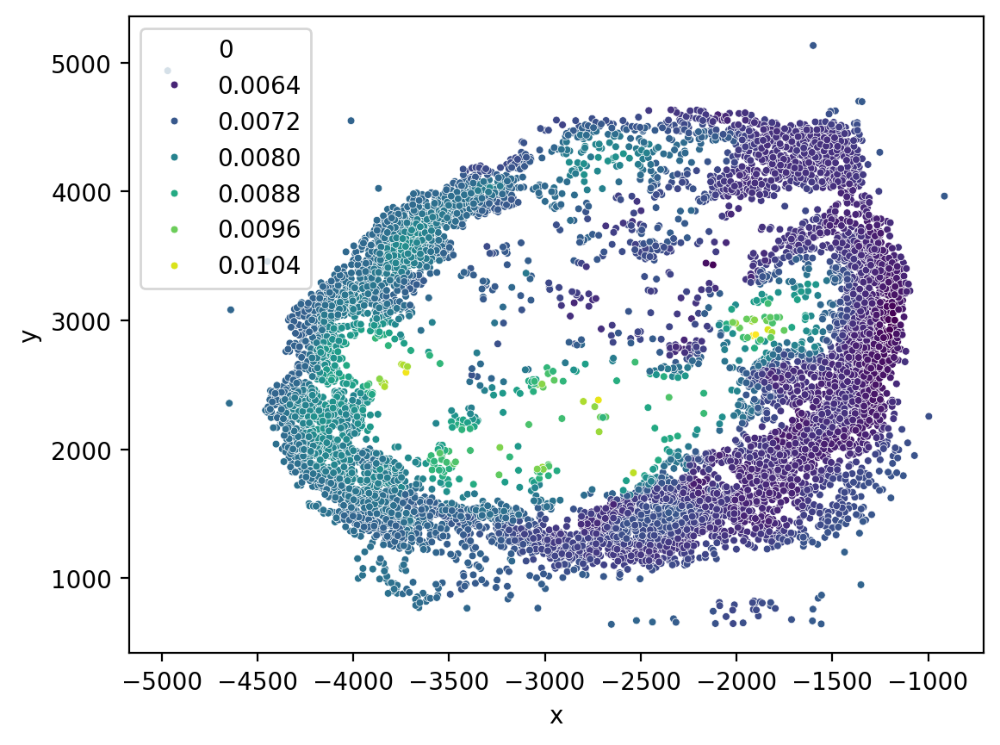

In [86]:
sns.scatterplot(data=dff[dff.rctd_celltypes == 'B-cell'], x='x', y='y', hue=0, s=10, palette='viridis')

In [64]:
sc.tl.tsne(bdata)

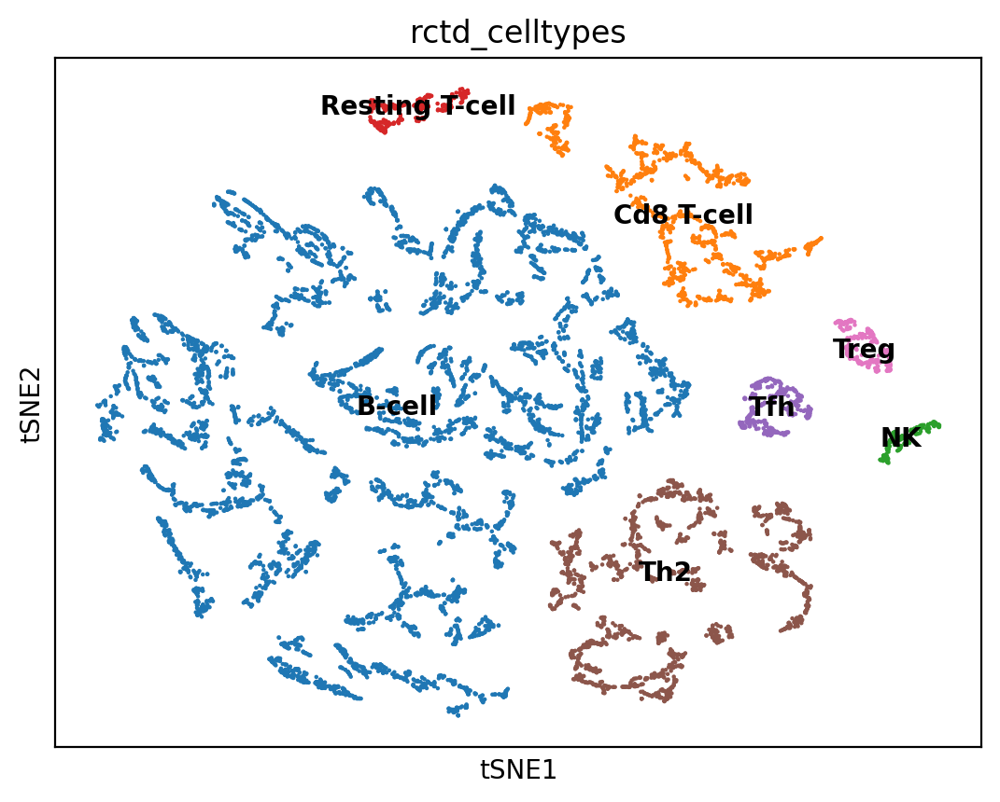

In [65]:
sc.pl.tsne(bdata, color='rctd_celltypes', legend_loc='on data', legend_fontsize=10)
plt.show()

ValueError: Could not interpret value `beta_Il2#Egr2` for `hue`. An entry with this name does not appear in `data`.

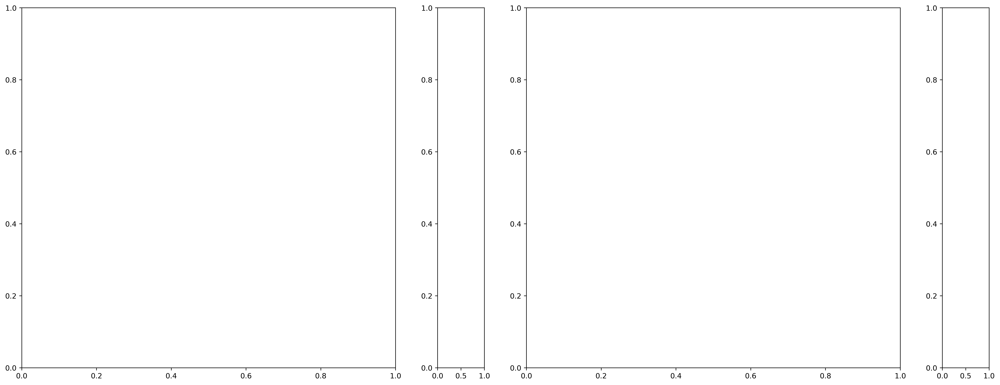

In [70]:
fig, axs = plt.subplots(1, 4, dpi=180, figsize=(12*2, 9*1), gridspec_kw={'width_ratios': [4, 0.5]*2})
axs = axs.flatten()
axs = [(axs[i], axs[i+1]) for i in range(0, len(axs), 2)]
plot('beta_Il2#Egr2', dpi=100, size=20, fig=fig, axes=axs[0])
plot('beta_Il2#Egr2', dpi=100, size=20, fig=fig, axes=axs[1], with_expr=True)
# plot('Egr2', dpi=100, size=20, fig=fig, axes=axs[2])
# plot('Il2', dpi=100, size=20, fig=fig, axes=axs[3])
# plot('beta_Egr2', dpi=100, size=20, fig=fig, axes=axs[4])
# plot('Il2#Egr2', dpi=100, size=20, fig=fig, axes=axs[5])
plt.show()


In [1]:
# plt.rcParams['figure.figsize'] = (25, 3)
# plt.rcParams['figure.dpi'] = 120

# hmap = df[[
#         'beta_'+i for i in estimator.modulators if '#' not in i and '$' not in i]+[
#             'rctd_celltypes']].groupby('rctd_celltypes').mean().abs()>0
# sns.heatmap(
#     hmap.loc[:, (hmap.sum(0) > 0)],
#     square=True,
#     cbar=False,
#     linewidths=0.5,
#     linecolor='black',
#     xticklabels=True,
#     yticklabels=True,
#     cmap='Reds'
# )
# plt.title(f'Modulators for {estimator.target_gene}', fontsize=15)
# plt.tight_layout()
# plt.show()

# plt.rcParams['figure.figsize'] = (25, 5)
# hmap = df[[
#         'beta_'+i for i in estimator.modulators if '$' in i]+[
#             'rctd_celltypes']].groupby('rctd_celltypes').mean().abs()>0
# sns.heatmap(
#     hmap.loc[:, (hmap.sum(0) > 0)],
#     square=True,
#     cbar=False,
#     linewidths=0.5,
#     linecolor='black',
#     xticklabels=True,
#     yticklabels=True,
#     cmap='Reds'
# )
# plt.title(f'Modulators for {estimator.target_gene}', fontsize=15)
# plt.tight_layout()
# plt.show()
# hmap = df[[
#         'beta_'+i for i in estimator.modulators if '#' in i]+[
#             'rctd_celltypes']].groupby('rctd_celltypes').mean().abs()>0
# sns.heatmap(
#     hmap.loc[:, (hmap.sum(0) > 0)],
#     square=True,
#     cbar=False,
#     linewidths=0.5,
#     linecolor='black',
#     xticklabels=True,
#     yticklabels=True,
#     cmap='Reds'
# )

# plt.title(f'Modulators for {estimator.target_gene}', fontsize=15)
# plt.tight_layout()
# plt.show()

In [17]:
import torch

In [53]:
# Create random tensors with PyTorch
X = torch.rand(100, 5000)
beta = torch.rand(100, 5000, 5000)

In [54]:
%%time

_ = torch.bmm(X.unsqueeze(1), beta).squeeze().numpy()

CPU times: user 723 ms, sys: 2.09 s, total: 2.81 s
Wall time: 2.82 s


In [49]:
np.array([X[i].dot(beta[i]) for i in range(n_cells)])

array([[0.13702772, 0.19225841, 0.24748909],
       [0.27830628, 0.34993997, 0.42157367],
       [0.64076799, 0.74032077, 0.83987354],
       [0.28644404, 0.32738886, 0.36833368],
       [1.20536068, 1.32947421, 1.45358774]])

In [26]:
X[0].shape, beta[0].shape

((3,), (3, 3))

In [10]:
beta[0].shape

(5,)

In [12]:
X[0].dot(beta[0])

ValueError: shapes (3,) and (5,) not aligned: 3 (dim 0) != 5 (dim 0)

In [342]:
adata = sc.read_h5ad('/Users/koush/Projects/SpaceOracle/data/slideseq/day3_1.h5ad')

In [343]:
adata

AnnData object with n_obs × n_vars = 15920 × 24649
    obs: 'cluster', 'rctd_cluster'
    uns: 'cluster_colors', 'rctd_cluster_colors'
    obsm: 'X_spatial', 'rctd_results', 'spatial'

In [344]:
import json
with open('/Users/koush/Projects/SpaceOracle/data/celltype_assign.json', 'r') as f:
    cell_type_mapping = json.load(f)
adata.obs['rctd_celltypes'] = adata.obs['rctd_cluster'].astype(str).map(cell_type_mapping)

In [345]:
markers = ['o', 'X', '<', '^', 'v', 'D', '>']
cmaps = dict(zip(range(7), ['rainbow', 'cool', 'RdYlGn_r', 'spring_r', '', 'PuRd', 'Reds']))

In [346]:
data = pd.DataFrame(adata.obsm['spatial'], columns=['x', 'y'], index=adata.obs.index).join(adata.obs)

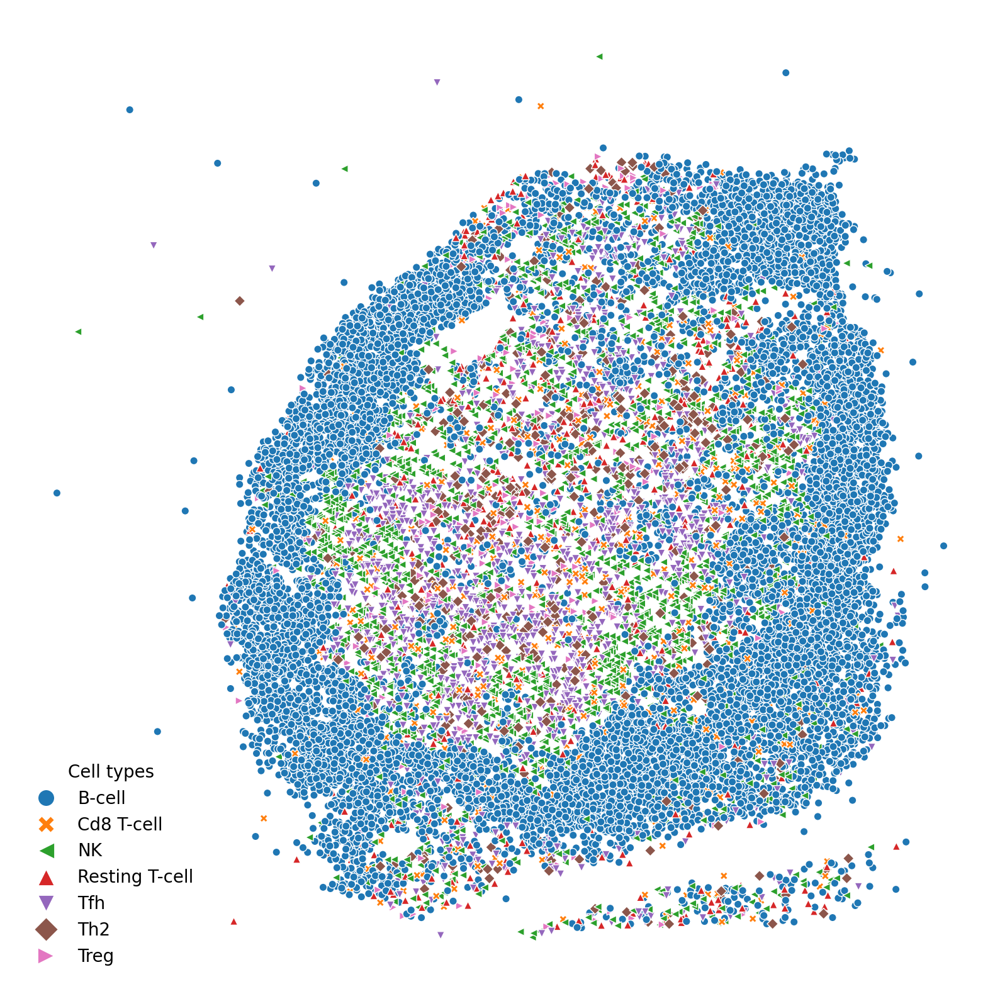

In [352]:
fig, ax = plt.subplots(1, dpi=100, figsize=(10, 10))

scatter = sns.scatterplot(
    data=data,
    x='x', 
    y='y',
    s=20,
    alpha=1,
    linewidth=0.5,
    edgecolor='white',
    legend=False,
    style='rctd_celltypes',
    hue='rctd_celltypes',
    markers=markers,
    ax=ax
)
ax.set_frame_on(False)
unique_styles = sorted(set(data['rctd_celltypes']))
palette = sns.color_palette(n_colors=len(unique_styles))
style_handles = [plt.Line2D([0], [0], marker=m, color='w', markerfacecolor=palette[i], 
                markersize=10, linestyle='None', alpha=1) 
                for i, m in enumerate(markers)][:len(unique_styles)]
ax.legend(style_handles, unique_styles, ncol=1,
title='Cell types', loc='lower left',  
frameon=False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
plt.savefig('/tmp/lymph.png', dpi=200, transparent=True)
plt.show()

In [34]:
adata_train = sc.read_h5ad('.cache/adata_train.h5ad')
adata_train

AnnData object with n_obs × n_vars = 11567 × 5013
    obs: 'cluster', 'rctd_cluster', 'rctd_celltypes'
    uns: 'log1p'
    obsm: 'X_spatial', 'rctd_results', 'spatial'
    layers: 'imputed_count', 'normalized_count', 'raw_count'

In [362]:
_df

,gex,perturbed
Pax5,0.275163,0.000000
Cd19,0.292229,0.072005
Akr1c18,0.408585,0.565407
Top2a,0.537421,0.690077
BC035044,0.316300,0.170669
Tnfrsf13c,0.287378,0.142365
Ptprv,0.289169,0.433455
Cr2,0.301890,0.157840
Prpf3,0.411646,0.271748
Otub2,0.233635,0.106679


In [372]:
import numpy as np
def find_neighbors(array, coord, n_neighbors=5):
    # Calculate euclidean distances from coord to all points
    distances = np.sqrt(np.sum((array - coord)**2, axis=1))
    
    # Get indices of n+1 smallest distances (including self)
    neighbor_indices = np.argpartition(distances, n_neighbors)[:n_neighbors]
    
    # Sort by distance
    neighbor_indices = neighbor_indices[np.argsort(distances[neighbor_indices])]
    
    return neighbor_indices


In [431]:
perturbed = pd.read_parquet('/Users/koush/Downloads/knockouts/Cxcr5_ko.parquet')
gex = min_max_df(adata_train.to_df(layer='imputed_count'))
delta_x = gex - perturbed

In [439]:
delta_x.mean().sort_values(ascending=False)[:20]

Cxcr5            0.280285
4930581F22Rik    0.000160
Retsat           0.000158
Dhodh            0.000131
Gapt             0.000123
Eln              0.000120
Prepl            0.000117
Slpi             0.000117
Esco1            0.000114
Rnaseh2a         0.000111
Crocc            0.000110
Tmem199          0.000109
Gmcl1            0.000108
Tcea2            0.000105
Mtx3             0.000103
Itgb3bp          0.000103
Sec63            0.000102
Zbtb37           0.000100
Nfam1            0.000100
Ankrd29          0.000099
dtype: float64

In [121]:
import numpy as np

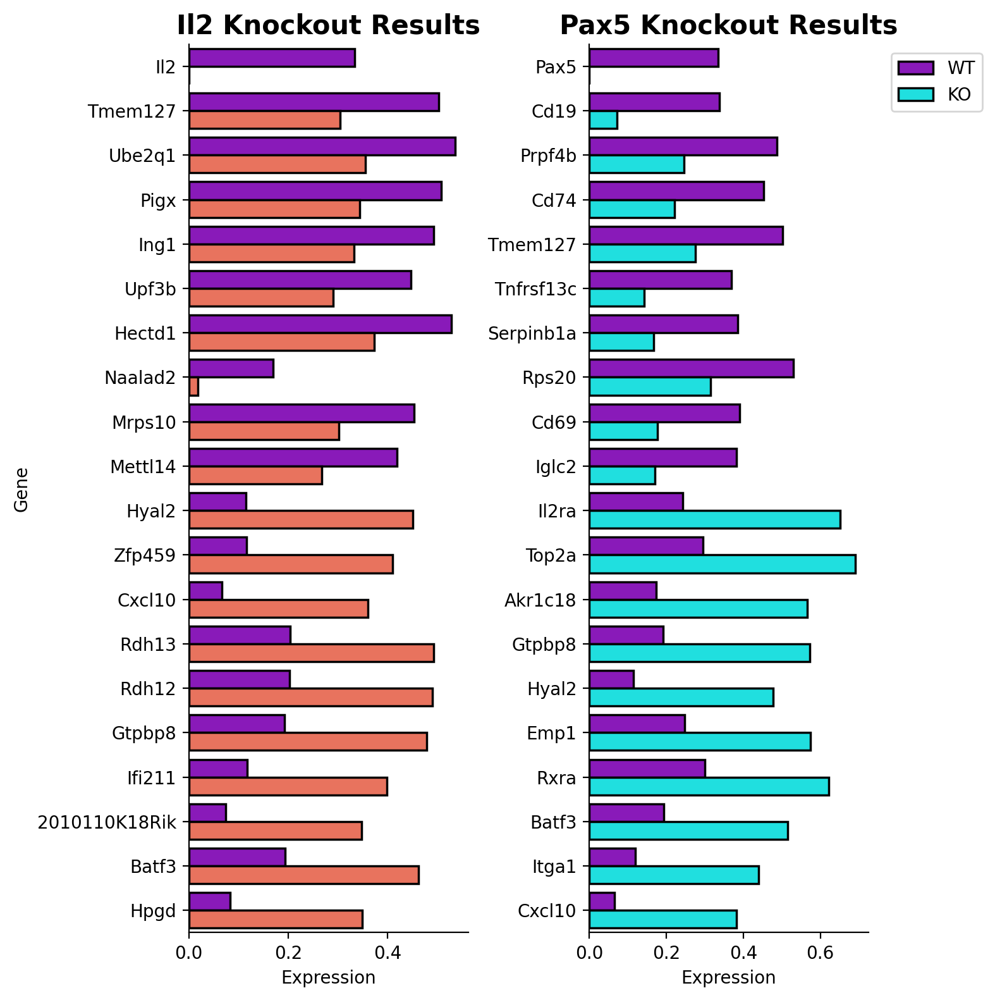

In [180]:
plt.rcParams['figure.figsize'] = (8, 8)
plt.rcParams['figure.dpi'] = 100

# Create figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2)

# Il2 KO plot
perturbed = pd.read_parquet('/Users/koush/Downloads/knockouts/Il2_ko.parquet')
gex = min_max_df(adata_train.to_df(layer='imputed_count'))
delta_x = gex - perturbed

genes = pd.concat([delta_x.mean().sort_values(ascending=False)[:10], delta_x.mean().sort_values()[:10]]).index
plot_data = []
for gene in genes:
    # Add WT data
    wt_values = gex[gene]
    plot_data.extend([{
        'Gene': gene,
        'Expression': val,
        'Condition': 'WT'
    } for val in wt_values])
    
    # Add KO data  
    ko_values = perturbed[gene]
    plot_data.extend([{
        'Gene': gene,
        'Expression': val,
        'Condition': 'KO'
    } for val in ko_values])

plot_df = pd.DataFrame(plot_data)

# Create Il2 barplot
sns.barplot(data=plot_df, x='Expression', y='Gene', hue='Condition',
            errorbar=None, errwidth=1, capsize=0.25, palette=['darkviolet', 'tomato'],
            orient='h', linewidth=1.25, edgecolor='black', ax=ax1)
ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True, ncol=1)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.set_title('Il2 Knockout Results', fontsize=15, fontweight='bold')

# Pax5 KO plot
perturbed = pd.read_parquet('/Users/koush/Downloads/knockouts/Pax5_ko.parquet')
delta_x = gex - perturbed

genes = pd.concat([delta_x.mean().sort_values(ascending=False)[:10], delta_x.mean().sort_values()[:10]]).index
plot_data = []
for gene in genes:
    # Add WT data
    wt_values = gex[gene]
    plot_data.extend([{
        'Gene': gene,
        'Expression': val,
        'Condition': 'WT'
    } for val in wt_values])
    
    # Add KO data  
    ko_values = perturbed[gene]
    plot_data.extend([{
        'Gene': gene,
        'Expression': val,
        'Condition': 'KO'
    } for val in ko_values])

plot_df = pd.DataFrame(plot_data)

# Create Pax5 barplot
sns.barplot(data=plot_df, x='Expression', y='Gene', hue='Condition',
            errorbar=None, errwidth=1, capsize=0.25, palette=['darkviolet', 'cyan'],
            orient='h', linewidth=1.25, edgecolor='black', ax=ax2)
ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True, ncol=1)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.set_title('Pax5 Knockout Results', fontsize=15, fontweight='bold')

ax1.get_legend().remove()
ax2.set_ylabel('')
plt.tight_layout()
plt.savefig('/tmp/knockouts.png', dpi=200, transparent=True)
plt.show()

In [130]:
plot_df

,Gene,Expression,SEM,Condition
0,Il2,0.333167,0.001039,WT
1,Tmem127,0.502638,0.001221,WT
2,Ube2q1,0.535054,0.001301,WT
3,Pigx,0.507502,0.001248,WT
4,Ing1,0.492562,0.001268,WT
5,Upf3b,0.446047,0.001296,WT
6,Hectd1,0.527601,0.001381,WT
7,Naalad2,0.168851,0.001877,WT
8,Mrps10,0.452525,0.001338,WT
9,Mettl14,0.418097,0.001228,WT


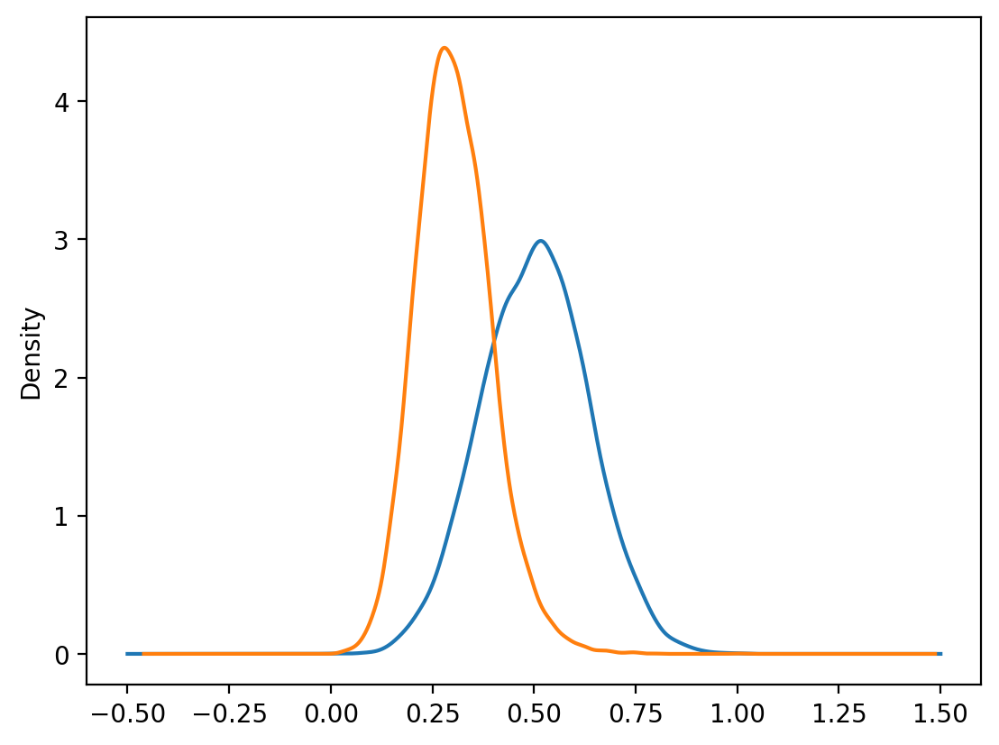

In [109]:
gex['Tmem127'].plot(kind='kde')
perturbed['Tmem127'].plot(kind='kde')
plt.show()


<Axes: ylabel='Frequency'>

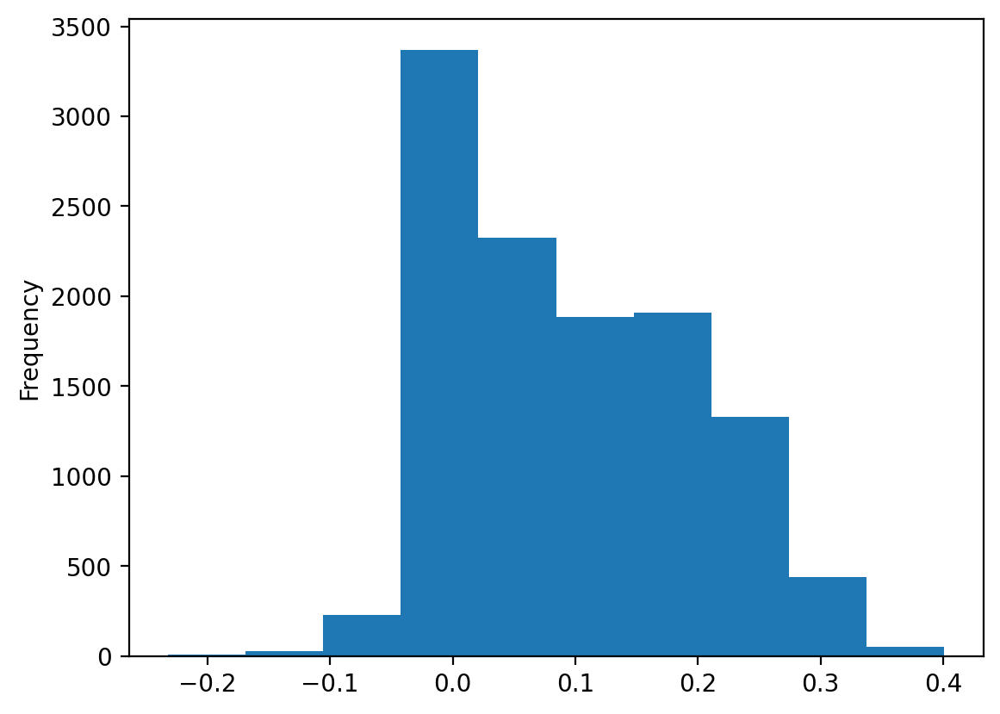

In [100]:
delta_x['Cd74'].plot(kind='hist')

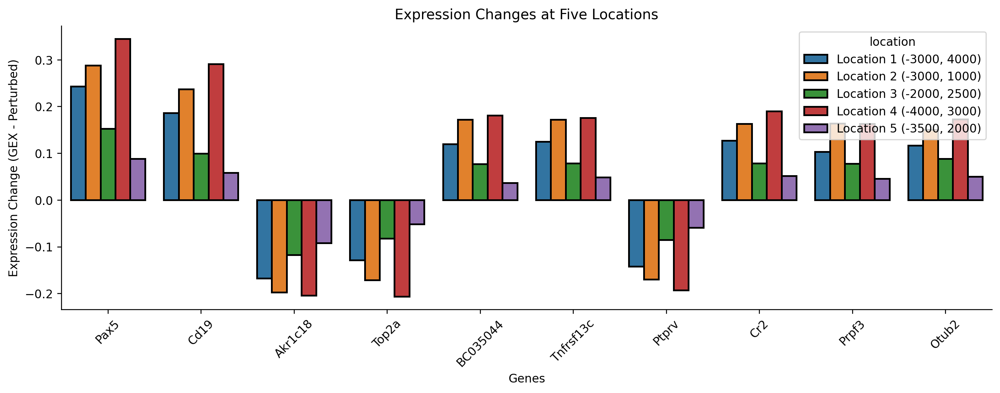

In [461]:
plt.rcParams['figure.figsize'] = (12, 4.8)
plt.rcParams['figure.dpi'] = 120
perturbed = pd.read_parquet('/Users/koush/Downloads/knockouts/Pax5_ko.parquet')
gex = min_max_df(adata_train.to_df(layer='imputed_count'))
delta_x = gex - perturbed

# Get indices for five different locations
N = find_neighbors(adata_train.obsm['spatial'], (-3000, 4000), 100)
N2 = find_neighbors(adata_train.obsm['spatial'], (-3000, 1000), 100)
N3 = find_neighbors(adata_train.obsm['spatial'], (-2000, 2500), 100)
N4 = find_neighbors(adata_train.obsm['spatial'], (-4000, 3000), 100)
N5 = find_neighbors(adata_train.obsm['spatial'], (-3500, 2000), 100)

targets = delta_x.mean().abs().sort_values(ascending=False)[:10].index

# Calculate delta for all locations
idx1 = adata_train.obs.iloc[N].index
idx2 = adata_train.obs.iloc[N2].index
idx3 = adata_train.obs.iloc[N3].index
idx4 = adata_train.obs.iloc[N4].index
idx5 = adata_train.obs.iloc[N5].index

delta1 = delta_x.loc[idx1, targets].mean()
delta2 = delta_x.loc[idx2, targets].mean()
delta3 = delta_x.loc[idx3, targets].mean()
delta4 = delta_x.loc[idx4, targets].mean()
delta5 = delta_x.loc[idx5, targets].mean()

# Combine into single dataframe
combined_df = pd.DataFrame({
    'Location 1 (-3000, 4000)': delta1,
    'Location 2 (-3000, 1000)': delta2,
    'Location 3 (-2000, 2500)': delta3,
    'Location 4 (-4000, 3000)': delta4,
    'Location 5 (-3500, 2000)': delta5
})

# Melt the dataframe for seaborn
melted_df = pd.melt(combined_df.reset_index(), id_vars=['index'], 
                    var_name='location', value_name='delta')

# Create single plot
fig, ax = plt.subplots()
sns.barplot(data=melted_df, x='index', y='delta', hue='location',
            linewidth=1.5, edgecolor='black')

ax.tick_params(axis='x', rotation=45)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_title('Expression Changes at Five Locations')
ax.set_xlabel('Genes')
ax.set_ylabel('Expression Change (GEX - Perturbed)')

plt.tight_layout()
plt.show()

In [456]:

delt.loc[estimator.adata.obs.iloc[N2].index, targets].mean()

Pax5         0.000000
Cd19         0.063124
Akr1c18      0.559462
Top2a        0.673674
BC035044     0.178772
Tnfrsf13c    0.180585
Ptprv        0.465906
Cr2          0.168810
Prpf3        0.215763
Otub2        0.100875
dtype: float64

In [455]:

perturbed.loc[estimator.adata.obs.iloc[N].index, targets].mean()


Pax5         0.000000
Cd19         0.078904
Akr1c18      0.529991
Top2a        0.678090
BC035044     0.168000
Tnfrsf13c    0.175374
Ptprv        0.409542
Cr2          0.156809
Prpf3        0.259352
Otub2        0.113945
dtype: float64

In [219]:
import umap
import numpy as np
import matplotlib.pyplot as plt

adata_train = sc.read_h5ad('.cache/adata_train.h5ad')

# Load data
perturbed = pd.read_parquet('/Users/koush/Downloads/knockouts/Pax5_ko.parquet')
gex = min_max_df(adata_train.to_df(layer='imputed_count'))

# Create UMAP embeddings
reducer = umap.UMAP(random_state=42, n_neighbors=50, min_dist=1.0, spread=5.0)
X = np.vstack([gex.values, perturbed.values])
umap_coords = reducer.fit_transform(X)

# Split coordinates back into WT and KO
n_wt = gex.shape[0]
wt_umap = umap_coords[:n_wt]
ko_umap = umap_coords[n_wt:]

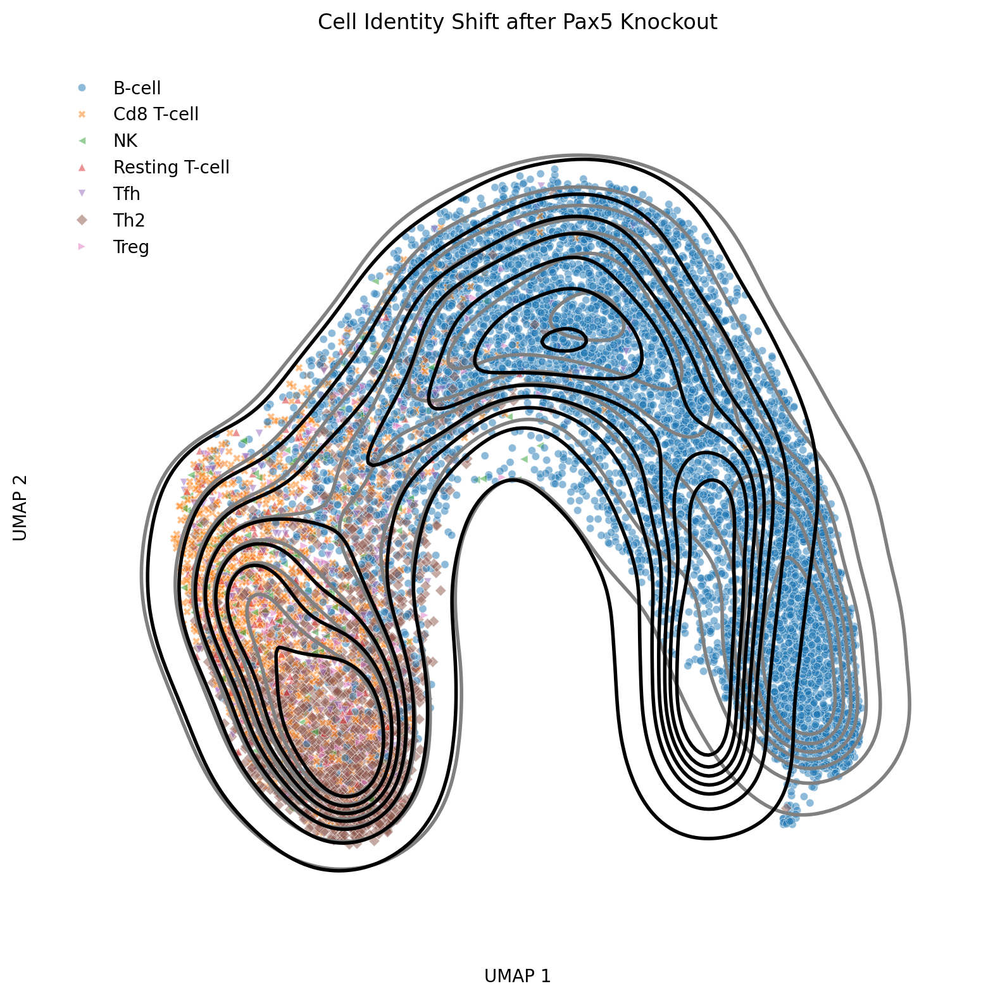

In [238]:
# Create elegant UMAP visualization
fig, ax = plt.subplots(figsize=(8, 8))

# Plot cell type scatter points with custom styling
sns.scatterplot(
    x=wt_umap[:,0], 
    y=wt_umap[:,1],
    hue=adata_train.obs.rctd_celltypes.values,
    alpha=0.5,
    s=20,
    style=adata_train.obs.rctd_celltypes.values,
    ax=ax,
    markers=['o', 'X', '<', '^', 'v', 'D', '>'],
)

# Add density contours for WT and KO
for coords, label, color in [(wt_umap, 'WT', 'grey'), 
                            (ko_umap, 'Pax5 KO', 'black')]:
    sns.kdeplot(
        x=coords[:,0],
        y=coords[:,1], 
        levels=8,
        alpha=1,
        linewidths=2,
        label=label,
        color=color,
        ax=ax,
        legend=True
    )

# Style the plot
ax.set_title('Cell Identity Shift after Pax5 Knockout', pad=20, fontsize=12)
ax.set_xlabel('UMAP 1', labelpad=10)
ax.set_ylabel('UMAP 2', labelpad=10)
ax.legend(ncol=1, loc='upper left', frameon=False)

# Remove frame
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
# Remove ticks
ax.set_xticks([])
ax.set_yticks([])

plt.tight_layout()
plt.savefig('/tmp/umap.png', dpi=200, transparent=True)
plt.show()

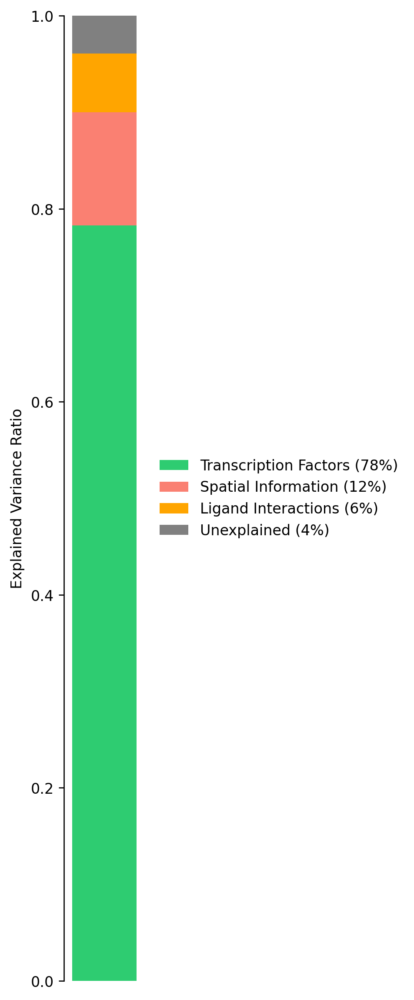

: 

In [255]:
# Create figure and axis
fig, ax = plt.subplots(figsize=(1, 12), dpi=120)

# Data for the stacked bars
components = ['Transcription Factors', 'Spatial Information', 'Ligand Interactions', 'Unexplained'] 
variances = [0.783, 0.117, 0.061]
variances.append(1 - sum(variances))

# Create stacked vertical bar
bottom = 0
colors = ['#2ecc71', 'salmon', 'orange', 'grey'] # Nice color palette
for i, (comp, var) in enumerate(zip(components, variances)):
    ax.bar(0, var, bottom=bottom, color=colors[i], 
           label=f'{comp} ({var:.0%})')
    bottom += var

# Style the plot
ax.set_xlim(-0.5, 0.5)
ax.set_ylim(0, 1)
ax.set_xticks([])
ax.set_ylabel('Explained Variance Ratio')

# Remove frame
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)

# Add legend
ax.legend(bbox_to_anchor=(1.02, 0, 0.2, 1), 
         loc="center left",
         ncol=1, frameon=False)

plt.tight_layout()
# Save figure before showing
plt.savefig('/tmp/variance.png', dpi=200, transparent=True, bbox_inches='tight')
plt.show()